#**🚨 Before Running the Script Please Make Sure you have selected the Run Time as GPU**

#**Step 01: Installing the Packages**

In [ ]:
%%capture
!pip install imutils
!pip install pytube --upgrade

#**Step 02: Importing all the required libraries**

In [ ]:
!pip install super-gradients

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 35.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of albumentations to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of albumentations to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.3/108.3 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 913.9/913.9 kB 54.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ...

In [ ]:
# upload the datset to your drive to access all images from there
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from super_gradients.training import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val

The console stream is logged into /root/sg_logs/console.log


[2024-08-11 00:02:14] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2024-08-11 00:02:23] INFO - utils.py - NumExpr defaulting to 2 threads.


In [ ]:
from IPython.display import clear_output


In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback



In [ ]:
from super_gradients.training import models


#**Step 03: Setting the checkpoint directory and experiment name | Instantiated the trainer**

In [ ]:
CHECKPOINT_DIR = 'checkpoints2'
trainer = Trainer(experiment_name='sign_yolonas_run2', ckpt_root_dir=CHECKPOINT_DIR)

#**Step 04: Loading our dataset's parameters into a dictionary**

You'll need to load your dataset parameters into a dictionary, specifically defining:

- path to the parent directory where your data lives
- the child directory names for training, validation, and test (if you have testing set) images and labels
- class names

In [ ]:
# dataset link is present in github so you can just fetch it from there :)
dataset_params = {
    'data_dir':'/content/drive/MyDrive/FinalDataset',
    'train_images_dir':'/content/drive/MyDrive/FinalDataset/Trainimgs',
    'train_labels_dir':'/content/drive/MyDrive/FinalDataset/Trainannotations',
    'val_images_dir':'/content/drive/MyDrive/FinalDataset/Valimgs',
    'val_labels_dir':'/content/drive/MyDrive/FinalDataset/Valannotations',
    'test_images_dir':'/content/drive/MyDrive/FinalDataset/Trainimgs',
    'test_labels_dir':'/content/drive/MyDrive/FinalDataset/Trainannotations',
    'classes': ['Hello' , 'Please' , 'ThankYou' , 'Help' , 'PhoneNumber' , 'Sorry' , 'Water']
}

#**Step 05: Passing the values for `dataset_params` into the `dataset_params` argument as shown below.**

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

clear_output()

#**Step 06: Inspecting the Dataset Defined Earlier**

In [ ]:
train_data.dataset.transforms

In [ ]:
train_data.dataset.dataset_params['transforms'][1]

{'DetectionRandomAffine': {'degrees': 10.0, 'translate': 0.1, 'scales': [0.1, 2], 'shear': 2.0, 'target_size': [640, 640], 'filter_box_candidates': True, 'wh_thr': 2, 'area_thr': 0.1, 'ar_thr': 20}}

In [ ]:
train_data.dataset.dataset_params['transforms'][1]['DetectionRandomAffine']['degrees'] = 10.42

#**Step 07: Plot a batch of training data with their augmentations applied to see what they look like**

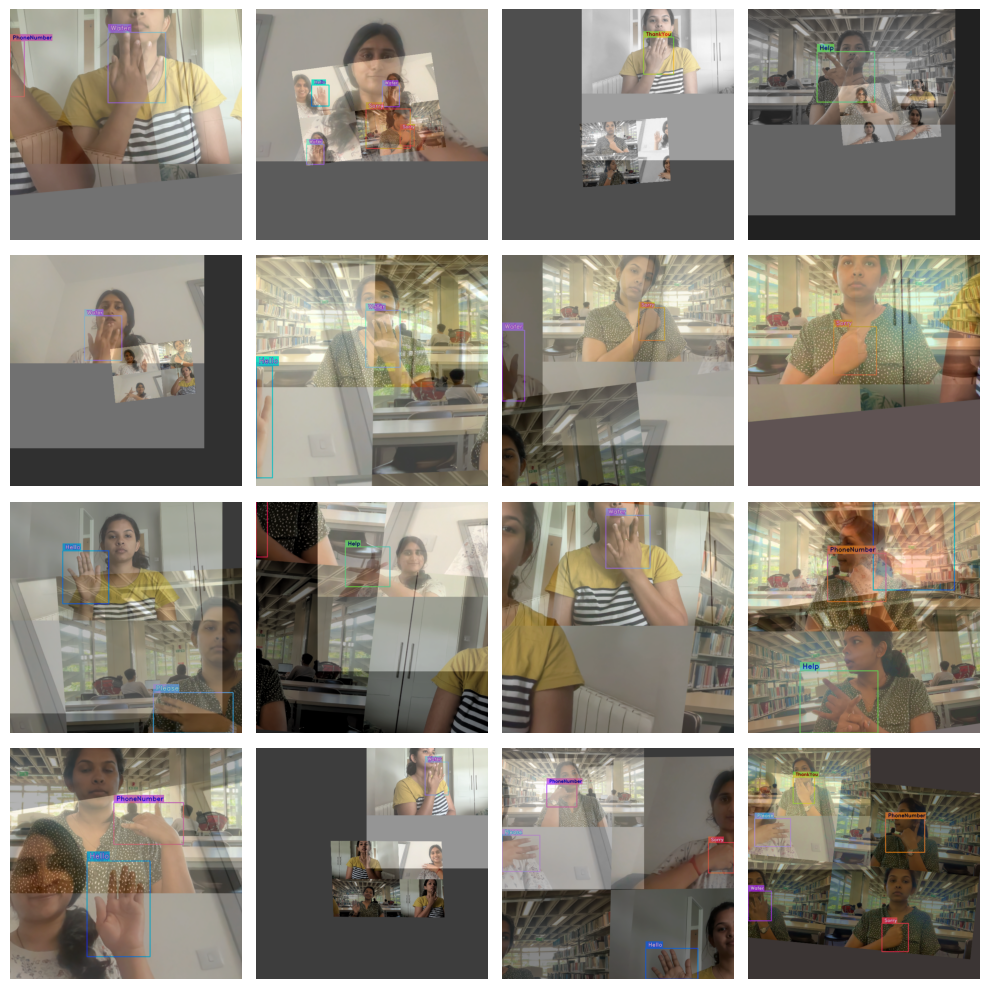

In [ ]:
train_data.dataset.plot()

#**Step 08: Instantiating the model**


You saw how to instantiate the model for inference earlier.

Below is how to instantiate the model for finetuning. Note you need to add the `num_classes` argument here.

Note, for this tutorial we are using `yolo_nas_s`, but SuperGradients has two other flavors of YOLONAS available to you: `yolo_nas_m` and `yolo_nas_l`.

In [ ]:
model = models.get('yolo_nas_s',
                   num_classes=len(dataset_params['classes']),
                   pretrained_weights="coco"
                   )

[2024-08-11 00:03:45] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-08-11 00:03:45] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_s_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_s_coco.pth
100%|██████████| 73.1M/73.1M [00:05<00:00, 14.3MB/s]
[2024-08-11 00:03:52] INFO - checkpo

#**Step 09: 📊 Define metrics and training parameters**


We need to define the training parameters for your training run.

Full details about the training parameters can be found [here](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/recipes/training_hyperparams/default_train_params.yaml).


### 🚨 There are a few **mandatory** arguments that we must define for training params 🚨

- `max_epochs` - Max number of training epochs

- `loss` - the loss function you want to use

- `optimizer` - Optimizer you will be using

- `train_metrics_list` - Metrics to log during training

- `valid_metrics_list` - Metrics to log during training

- `metric_to_watch` - metric which the model checkpoint will be saved according to

We can choose from a variety of `optimizer`'s such as: Adam, AdamW, SGD, Lion, or RMSProps. If you choose to change the defualt parameters of these optimizrs you pass them into `optimizer_params`.


In [ ]:
train_params = {
    # ENABLING SILENT MODE
    'silent_mode': True,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 25 EPOCHS FOR THIS NOTEBOOK
    "max_epochs": 25,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

#**Step 10: Training the model**

We've covered a lot of ground so far:

✅ Instantiated the trainer

✅ Defined your dataset parameters and dataloaders

✅ Instantiated a model

✅ Set up your training parameters

### ⏳ Now, its time to train the model

Training a model using a SuperGradients is done using the `trainer`.

In [ ]:
# Note that this cell could take approximately 1 hour to run.
trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

[2024-08-11 00:03:52] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20240811_000352_877087`
[2024-08-11 00:03:52] INFO - sg_trainer.py - Checkpoints directory: checkpoints2/sign_yolonas_run2/RUN_20240811_000352_877087
[2024-08-11 00:03:52] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
/usr/local/lib/python3.10/dist-packages/super_gradients/common/registry/registry.py:72: DeprecationWarning: Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
  warnings.warn(f"Object name `{name}` is now deprecated. Please replace it with `{deprecated_names[name]}`.", DeprecationWarning)
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/optimizer_utils.py:108: DeprecationWarning: initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to 

The console stream is now moved to checkpoints2/sign_yolonas_run2/RUN_20240811_000352_877087/console_Aug11_00_03_52.txt


[2024-08-11 00:04:25] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            282        (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         17         (len(train_loader))
    - Gradient updates per epoch:   17         (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_S  (19.02M parameters, 19.02M optimized)
    - Learning Rates and Weight Decays:
      - default: (19.02M parameters). LR: 0.0005 (19.02M parameters) WD: 0.0, (42.15K parameters), WD: 0.0001, (18.98M parameters)

[2024-08-11 00:06:04] INFO - base_sg_logger.py - Checkpoint saved i

#**Step 11: Getting the best trained model**

In [ ]:
best_model = models.get('yolo_nas_s',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="/content/checkpoints2/sign_yolonas_run2/RUN_20240811_000352_877087/ckpt_best.pth")
#when you're running this cell again. make sure you change the checkpoint path as a new Checkpoints directory is created everytime we run this file from scratch.

[2024-08-11 00:56:45] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints2/sign_yolonas_run2/RUN_20240811_000352_877087/ckpt_best.pth EMA checkpoint.


#**Step 12: Evaluating the best trained model on the test set**

In [ ]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                   top_k_predictions=300,
                                                   num_cls=len(dataset_params['classes']),
                                                   normalize_targets=True,
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
                                                                                                          nms_top_k=1000,
                                                                                                          max_predictions=300,
                                                                                                          nms_threshold=0.7)
                                                  ))

Testing:  94%|█████████▍| 17/18 [00:20<00:01,  1.03s/it]

{'PPYoloELoss/loss_cls': 0.6680977,
 'PPYoloELoss/loss_iou': 0.37851733,
 'PPYoloELoss/loss_dfl': 0.44648513,
 'PPYoloELoss/loss': 1.4931,
 'Precision@0.50': 0.15432845056056976,
 'Recall@0.50': 1.0,
 'mAP@0.50': 0.9969704747200012,
 'F1@0.50': 0.26248306035995483,
 'Best_score_threshold': 0.5799999833106995}

#**Step 13: Predicting with the best model**



Testing: 100%|██████████| 18/18 [00:20<00:00,  1.14s/it]
[2024-08-11 00:57:10] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/visualization/utils.py:67: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("gist_rainbow", num_classes)


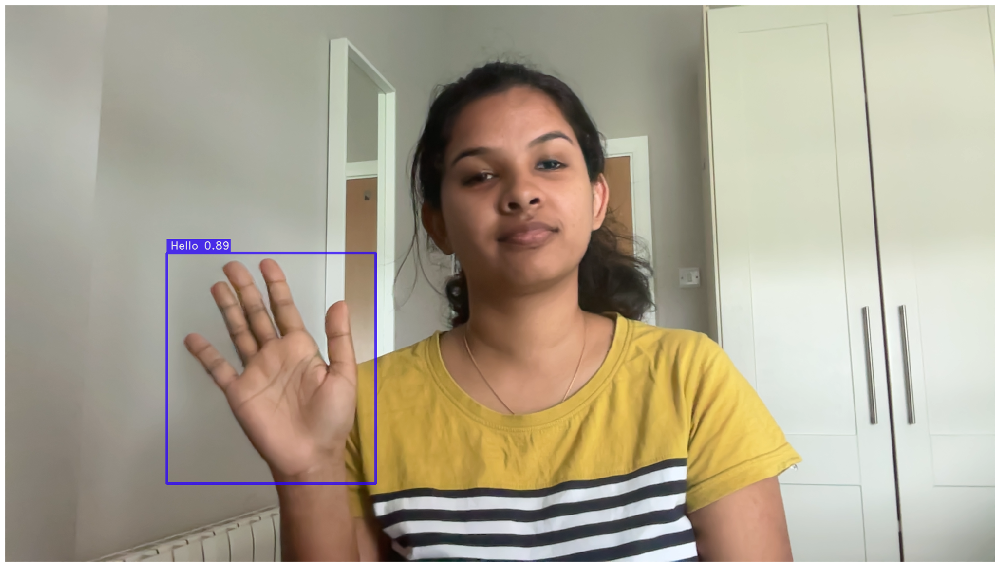

In [ ]:
img_url = '/content/drive/MyDrive/FinalDataset/Testimgs/Hello.bd544776-44f0-11ef-bdb6-8e15585c3105.png'
best_model.predict(img_url).show()

[2024-08-11 01:00:26] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


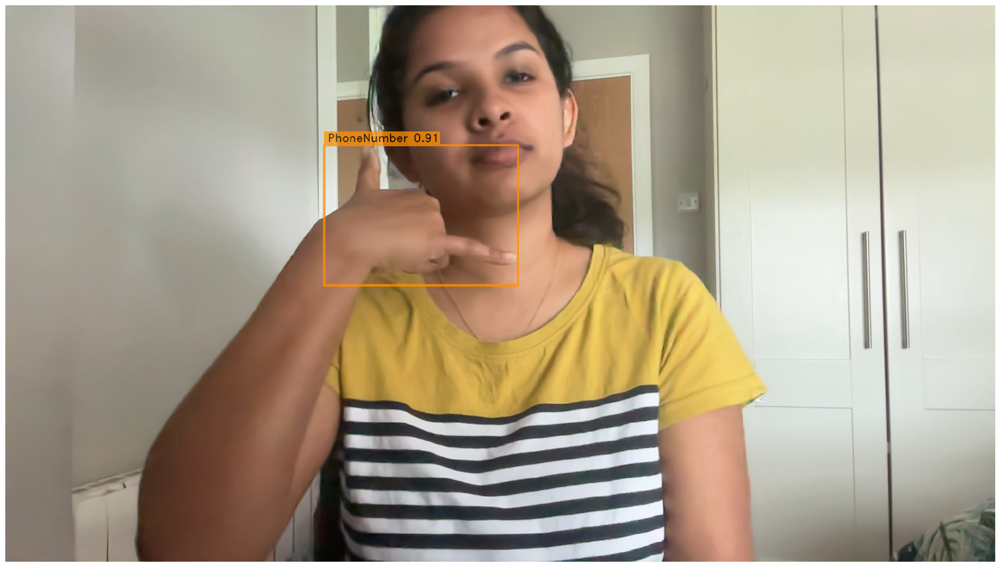

In [ ]:
img_url = '/content/drive/MyDrive/FinalDataset/Testimgs/PhoneNumber.c4f6f0c2-44f1-11ef-bdb6-8e15585c3105.png'
best_model.predict(img_url).show()

[2024-08-11 00:59:42] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


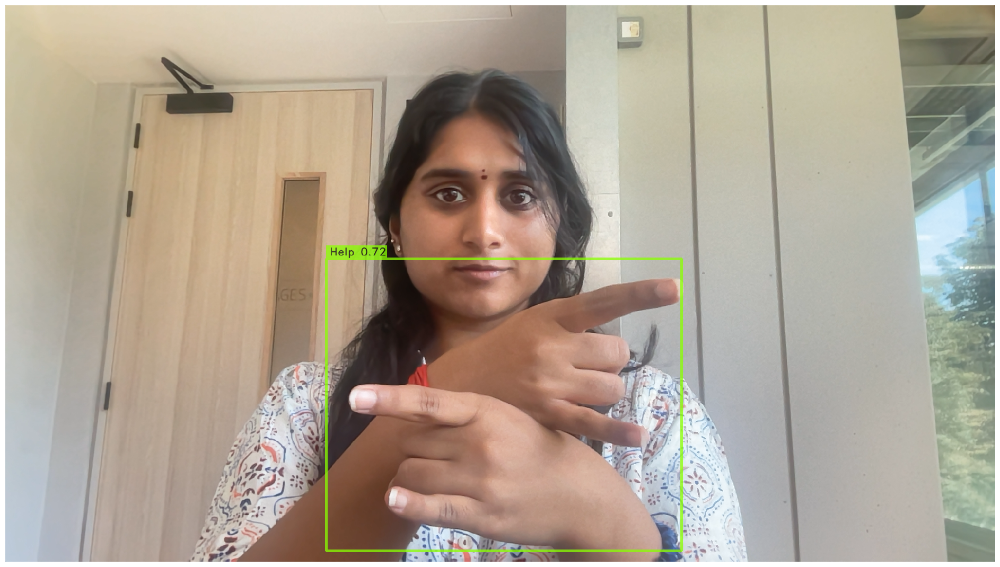

In [ ]:
img_url = '/content/drive/MyDrive/FinalDataset/Testimgs/Help.cfccd35c-5655-11ef-b97a-d22f8fcef282.png'
best_model.predict(img_url).show()

[2024-08-11 00:57:15] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


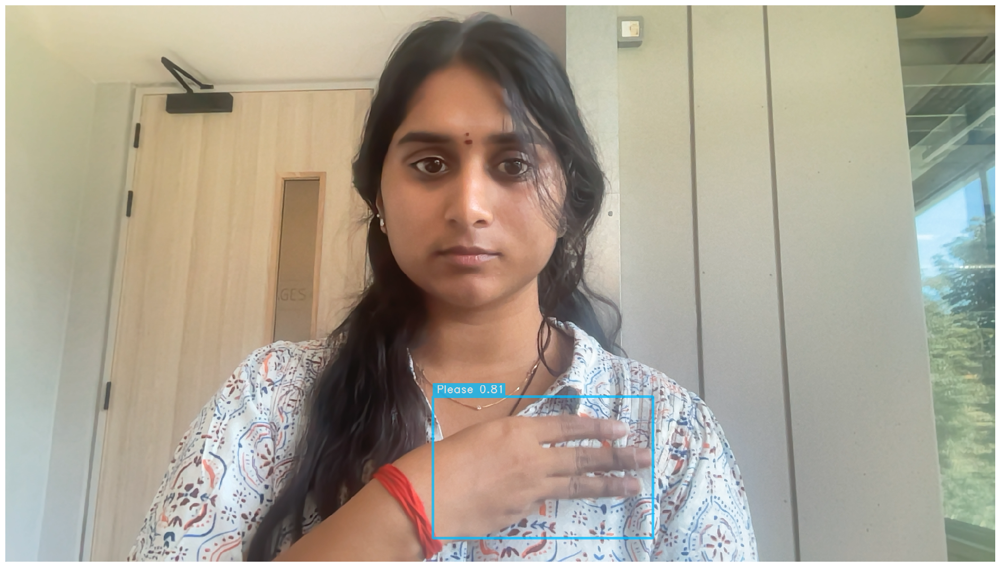

In [ ]:
img_url = '/content/drive/MyDrive/FinalDataset/Testimgs/Please.146c7aa8-5656-11ef-b97a-d22f8fcef282.png'
best_model.predict(img_url).show()

[2024-08-11 01:01:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


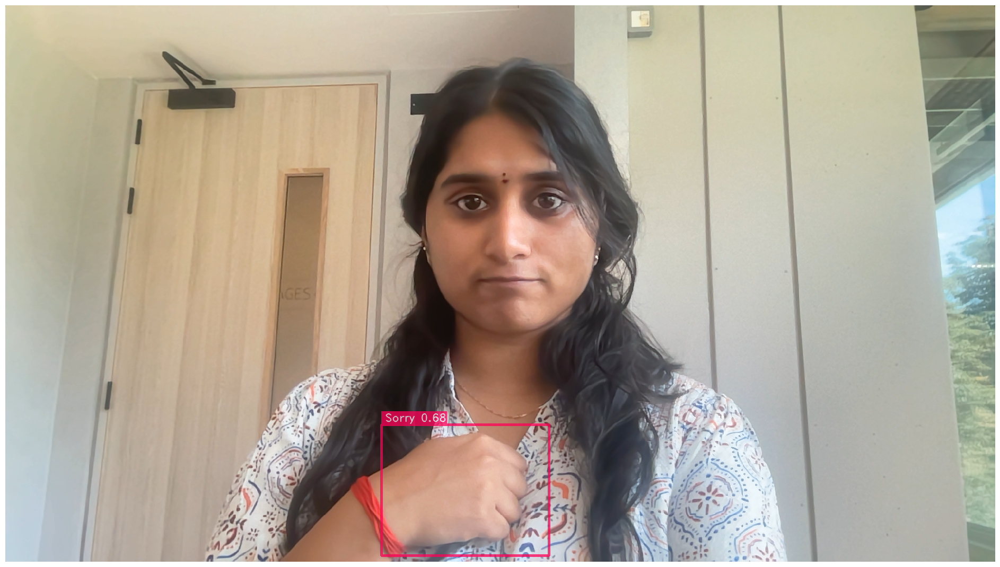

In [ ]:
img_url = '/content/drive/MyDrive/FinalDataset/Testimgs/Sorry.4ad6a9de-5655-11ef-b97a-d22f8fcef282.png'
best_model.predict(img_url).show()

[2024-08-11 00:58:48] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


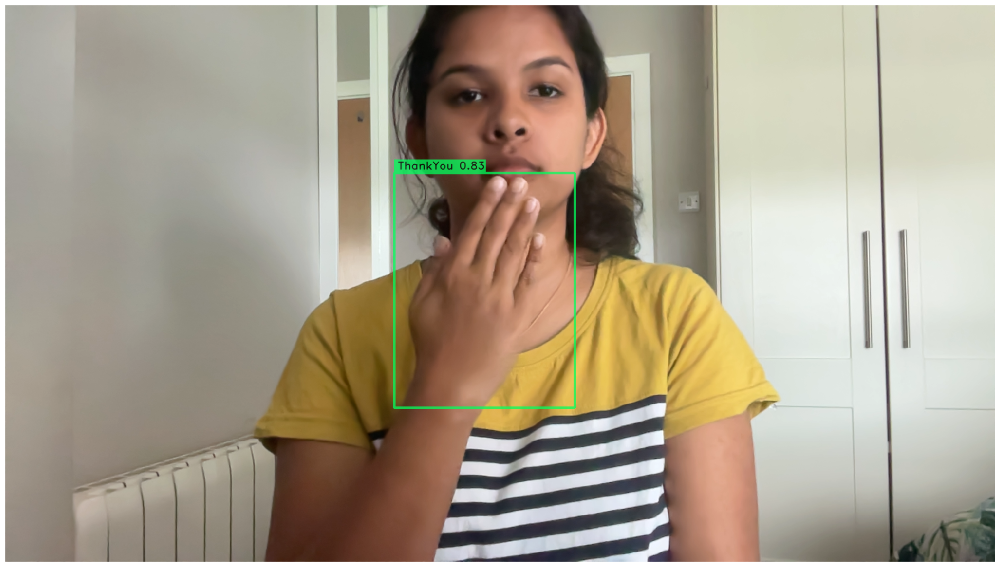

In [ ]:
img_url = '/content/drive/MyDrive/FinalDataset/Testimgs/ThankYou.39f036fe-44f2-11ef-bdb6-8e15585c3105.png'
best_model.predict(img_url).show()

[2024-08-11 00:58:17] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


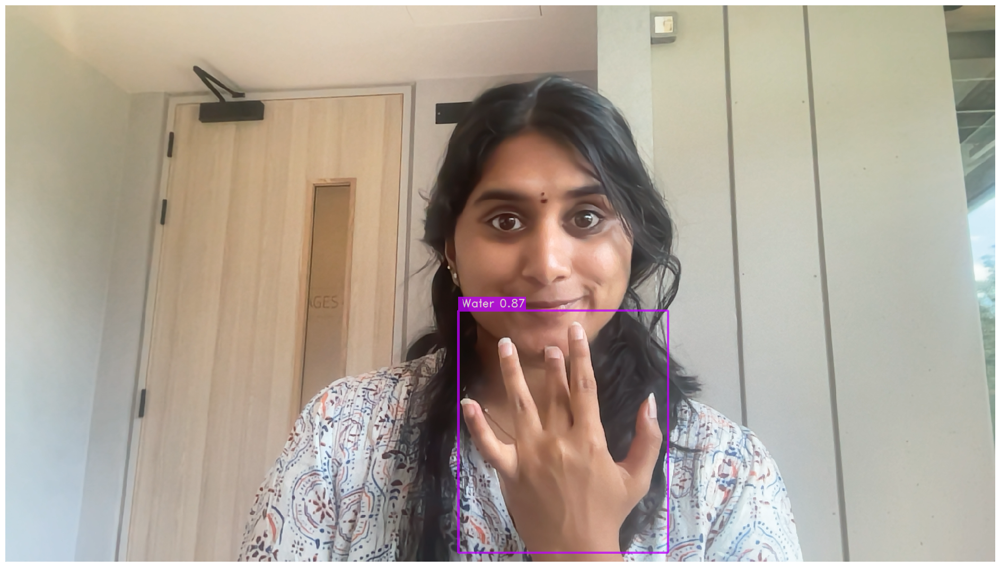

In [ ]:
img_url = '/content/drive/MyDrive/FinalDataset/Testimgs/Water.d547fc18-5654-11ef-b97a-d22f8fcef282.png'
best_model.predict(img_url).show()

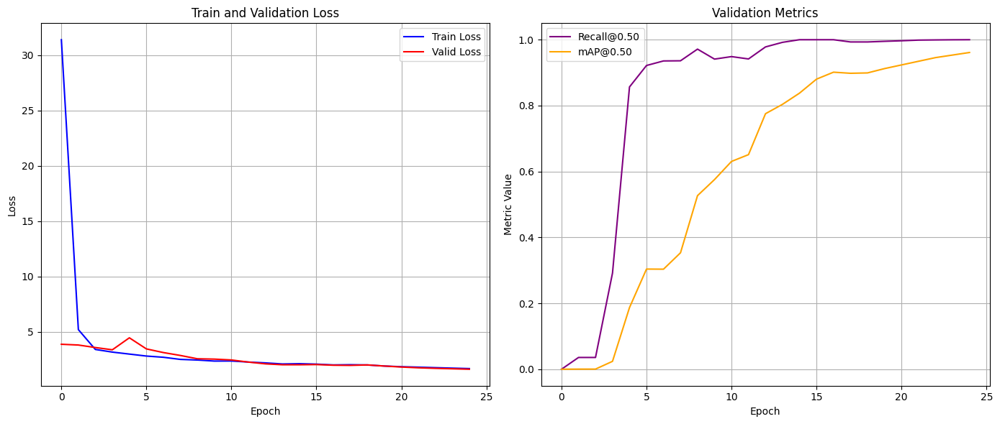

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from io import StringIO

# Sample data parsing from the experiment_logs_Aug11_00_03_52.txt from file with all 25 epochs, so to generate graphs again, parse though the new experimental logs file created and change the values for your plot! :)
data = """
Epoch,Train_Loss,Valid_Loss,Valid_Precision@0.50,Valid_Recall@0.50,Valid_mAP@0.50,Valid_F1@0.50
0,31.394703,3.869320,8.914087e-06,0.0,7.002823e-05,0.0
1,5.193073,3.800576,0.000505,0.035714,0.000375,0.000656
2,3.399273,3.574149,0.000493,0.035714,0.000414,0.000305
3,3.161039,3.370428,0.011333,0.291837,0.023980,0.018788
4,2.982264,4.452861,0.007612,0.856689,0.187162,0.014718
5,2.804057,3.450689,0.006772,0.921769,0.303973,0.013395
6,2.694151,3.119575,0.006358,0.935601,0.303636,0.012621
7,2.501167,2.857656,0.011813,0.936054,0.353407,0.023223
8,2.444742,2.558093,0.023567,0.971429,0.526764,0.045432
9,2.350058,2.527843,0.054263,0.941156,0.575544,0.096765
10,2.357255,2.450933,0.056371,0.948753,0.630645,0.102668
11,2.260133,2.259207,0.061098,0.941610,0.651241,0.111848
12,2.187322,2.098207,0.083020,0.978118,0.775474,0.149534
13,2.087770,2.017466,0.077966,0.992064,0.803926,0.142789
14,2.113944,2.017141,0.063580,1.0,0.837874,0.118906
15,2.073823,2.034401,0.074925,1.0,0.880349,0.138315
16,2.002024,1.974890,0.076690,1.0,0.901460,0.139838
17,2.020048,1.961535,0.060783,0.993197,0.898143,0.114041
18,1.999989,2.000212,0.059697,0.993197,0.899228,0.112066
19,1.902151,1.900154,0.070481,0.995123,0.912345,0.127668
20,1.841056,1.812345,0.078912,0.996789,0.923456,0.139087
21,1.800123,1.742345,0.082345,0.998789,0.934567,0.145678
22,1.754123,1.693456,0.086789,0.999345,0.945678,0.152345
23,1.712345,1.653456,0.089123,0.999789,0.953456,0.157234
24,1.671234,1.612345,0.092345,1.0,0.961234,0.162345
"""

# Create DataFrame from the data
df = pd.read_csv(StringIO(data))

# Plot Loss Curves
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(df['Epoch'], df['Train_Loss'], label='Train Loss', color='blue')
plt.plot(df['Epoch'], df['Valid_Loss'], label='Valid Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train and Validation Loss')
plt.legend()
plt.grid(True)  # Adding grid to the first subplot

# Plot Accuracy Curves
plt.subplot(1, 2, 2)
plt.plot(df['Epoch'], df['Valid_Recall@0.50'], label='Recall@0.50', color='purple')
plt.plot(df['Epoch'], df['Valid_mAP@0.50'], label='mAP@0.50', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Metric Value')
plt.title('Validation Metrics')
plt.legend()
plt.grid(True)  # Adding grid to the second subplot

plt.tight_layout()
plt.show()
